<a href="https://colab.research.google.com/github/jtang46/AWP/blob/main/Waldo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install tensorflow==1.15.3
!pip uninstall -y keras-nightly
!pip install h5py==2.10.0
!pip install keras==2.2.4

In [ ]:
!git clone https://github.com/matterport/Mask_RCNN.git

Cloning into 'Mask_RCNN'...
remote: Enumerating objects: 956, done.
remote: Total 956 (delta 0), reused 0 (delta 0), pack-reused 956
Receiving objects: 100% (956/956), 125.23 MiB | 30.72 MiB/s, done.
Resolving deltas: 100% (562/562), done.


In [ ]:
!python Mask_RCNN/setup.py install
!cp -r Mask_RCNN/mrcnn ./

running install
running bdist_egg
running egg_info
writing mask_rcnn.egg-info/PKG-INFO
writing dependency_links to mask_rcnn.egg-info/dependency_links.txt
writing top-level names to mask_rcnn.egg-info/top_level.txt
reading manifest file 'mask_rcnn.egg-info/SOURCES.txt'
writing manifest file 'mask_rcnn.egg-info/SOURCES.txt'
installing library code to build/bdist.linux-x86_64/egg
running install_lib
running build_py
copying mrcnn/parallel_model.py -> build/lib/mrcnn
copying mrcnn/config.py -> build/lib/mrcnn
copying mrcnn/utils.py -> build/lib/mrcnn
copying mrcnn/__init__.py -> build/lib/mrcnn
copying mrcnn/visualize.py -> build/lib/mrcnn
copying mrcnn/model.py -> build/lib/mrcnn
creating build/bdist.linux-x86_64/egg
creating build/bdist.linux-x86_64/egg/mrcnn
copying build/lib/mrcnn/parallel_model.py -> build/bdist.linux-x86_64/egg/mrcnn
copying build/lib/mrcnn/config.py -> build/bdist.linux-x86_64/egg/mrcnn
copying build/lib/mrcnn/utils.py -> build/bdist.linux-x86_64/egg/mrcnn
copying 

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
#import os
#os.chdir("/content/drive/My Drive/CSC 466")


In [12]:
# split into train and test set
# https://github.com/keras-team/keras/issues/8595
# https://stackoverflow.com/questions/25412513/inline-images-have-low-quality
from os import listdir
from os import path
import csv
from numpy import zeros
from numpy import asarray
from mrcnn.utils import Dataset
from numpy import expand_dims
from matplotlib import pyplot
from matplotlib.patches import Rectangle
from mrcnn.config import Config
from mrcnn.model import MaskRCNN
from mrcnn.model import mold_image
from mrcnn.utils import Dataset
from mrcnn.visualize import display_instances
from mrcnn.utils import extract_bboxes

import matplotlib as mpl
mpl.rcParams['figure.dpi']= 100


# class that defines and loads the waldo dataset
class WaldoDataset(Dataset):

    # load the dataset definitions
    def load_dataset(self, dataset_dir, is_train=True):
        # define one class
        self.add_class("dataset", 1, "waldo")
        # define data locations
        images_dir = dataset_dir
        #annotations_dir = dataset_dir
        # find all images
        for filename in listdir(images_dir):
            # extract image id
            image_id = filename[:-4]
            if(not image_id.isnumeric()):
              continue
            # skip bad images
            if image_id in ['00090']:
              continue
            # skip all images that aren't purely numerical
            # if is_train and not image_id.isnumeric():
            if is_train and int(image_id) >= 25:
              continue
            # skip all images not containing "eval" if we're building test/eval set
            # if not is_train and image_id[0:4] != "eval":
            if not is_train and int(image_id) < 25 :
              continue
            img_path = images_dir + filename
            ann_path = images_dir + 'annotations.csv'
            self.add_image('dataset', image_id=image_id, path=img_path, annotation=ann_path)
 	
    # extract bounding boxes from an annotation file
    def extract_boxes(self, filename):
      boxes = []
      width, height, xmin, ymin, xmax, ymax = 0, 0, 0, 0, 0, 0
      with open('annotations.csv', mode = 'r') as csvfile:
        reader = csv.reader(csvfile)
        header = next(reader)
        for row in reader:
          if row[0] == filename:
            xmin = int(row[-4])
            ymin = int(row[-3])
            xmax = int(row[-2])
            ymax = int(row[-1])
            coors = [xmin, ymin, xmax, ymax]
            boxes.append(coors)
            width = int(row[1])
            height = int(row[2])
            break
      return boxes, width, height
 
	# load the masks for an image
    def load_mask(self, image_id):
      # get details of image
      info = self.image_info[image_id]
      # define box file location
      path = info['id'] + ".jpg"
      boxes, w, h = self.extract_boxes(path)
      # print(boxes, w, h)
      # create one array for all masks, each on a different channel
      masks = zeros([h, w, len(boxes)], dtype='uint8')
      # create masks
      class_ids = list()
      for i in range(len(boxes)):
        box = boxes[i]
        row_s, row_e = box[1], box[3]
        col_s, col_e = box[0], box[2]
        masks[row_s:row_e, col_s:col_e, i] = 1
        class_ids.append(self.class_names.index('waldo'))
      return masks, asarray(class_ids, dtype='int32')
  
    # load an image reference
    def image_reference(self, image_id):
      info = self.image_info[image_id]
      return info['path']

# define the prediction configuration
# indent is broken here xd, do not type new code
class TrainConfig(Config):
	# define the name of the configuration
  NAME = "waldo_cfg"
	# number of classes (background + kangaroo)
  NUM_CLASSES = 1 + 1
  # steps 
  STEPS_PER_EPOCH = 30
  VALIDATION_STEPS = 50
# plot a number of photos with ground truth and predictions
def plot_actual_vs_predicted(dataset, model, cfg, n_images=5):
	# load image and mask
  for i in range(n_images):
		# load the image and mask
    image = dataset.load_image(i)
    mask, _ = dataset.load_mask(i)
		# convert pixel values (e.g. center)
    scaled_image = mold_image(image, cfg)
		# convert image into one sample
    sample = expand_dims(scaled_image, 0)
		# make prediction
    yhat = model.detect(sample, verbose=0)[0]
		# define subplot
		# pyplot.subplot(n_images, 2, i*2+1)
		# plot raw pixel data
    # pyplot.figure(figsize = (10,10))
    # pyplot.imshow(image)
    # pyplot.title('Actual')
		# plot masks
    for j in range(mask.shape[2]):
      pyplot.figure(figsize = (10,10))
      pyplot.imshow(mask[:, :, j], cmap='gray', alpha=0.3)
		# get the context for drawing boxes
    pyplot.subplot(n_images, 2, i*2+2)
		# plot raw pixel data
    pyplot.figure(figsize = (10,10))
    pyplot.imshow(image, aspect='auto')
    pyplot.title('Predicted')
    ax = pyplot.gca()
		# plot each box
    for box in yhat['rois']:
			# get coordinates
      y1, x1, y2, x2 = box
			# calculate width and height of the box
      width, height = x2 - x1, y2 - y1
			# create the shape
      rect = Rectangle((x1, y1), width, height, fill=False, color='red')
			# draw the box
      ax.add_patch(rect)
	# show the figure
  pyplot.show()

# train set
train_set = WaldoDataset()
train_set.load_dataset("./", is_train=True)
train_set.prepare()
# print('Train: %d' % len(train_set.image_ids))

# # test/eval set
test_set = WaldoDataset()
test_set.load_dataset("./", is_train=False)
test_set.prepare()
print('Test: %d' % len(test_set.image_ids))

Test: 43


In [ ]:
# create config
Train_cfg = TrainConfig()
Train_cfg.display()

model = MaskRCNN(mode='training', model_dir='./', config=Train_cfg)
# load weights (mscoco) and exclude the output layers
model.load_weights('/content/drive/My Drive/CSC 466/mask_rcnn_coco.h5', by_name=True, exclude=["mrcnn_class_logits", "mrcnn_bbox_fc",  "mrcnn_bbox", "mrcnn_mask"])
# train weights (output layers or 'heads')
model.train(train_set, test_set, learning_rate=Train_cfg.LEARNING_RATE, epochs=5, layers='heads')


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

AttributeError: ignored

In [13]:
class TestConfig(Config):
	# define the name of the configuration
	NAME = "waldo_cfg"
	# number of classes (background + kangaroo)
	NUM_CLASSES = 1 + 1
	# simplify GPU config
	GPU_COUNT = 1
	IMAGES_PER_GPU = 1

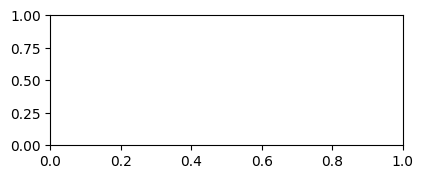

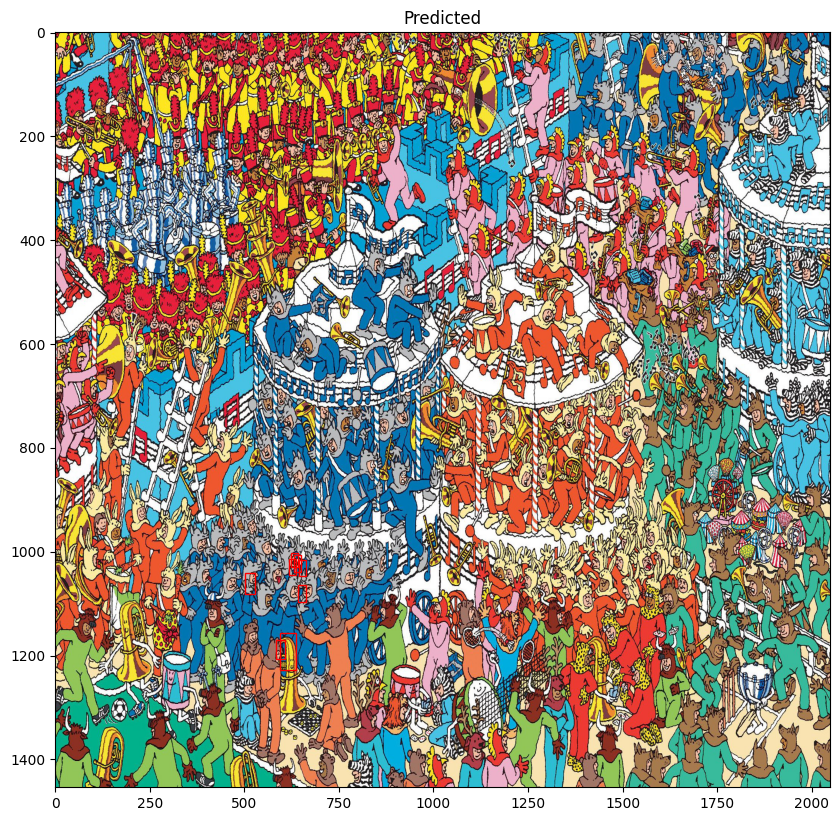

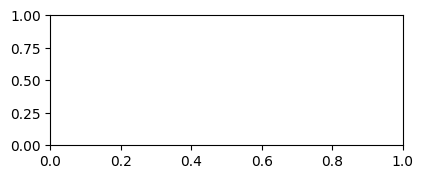

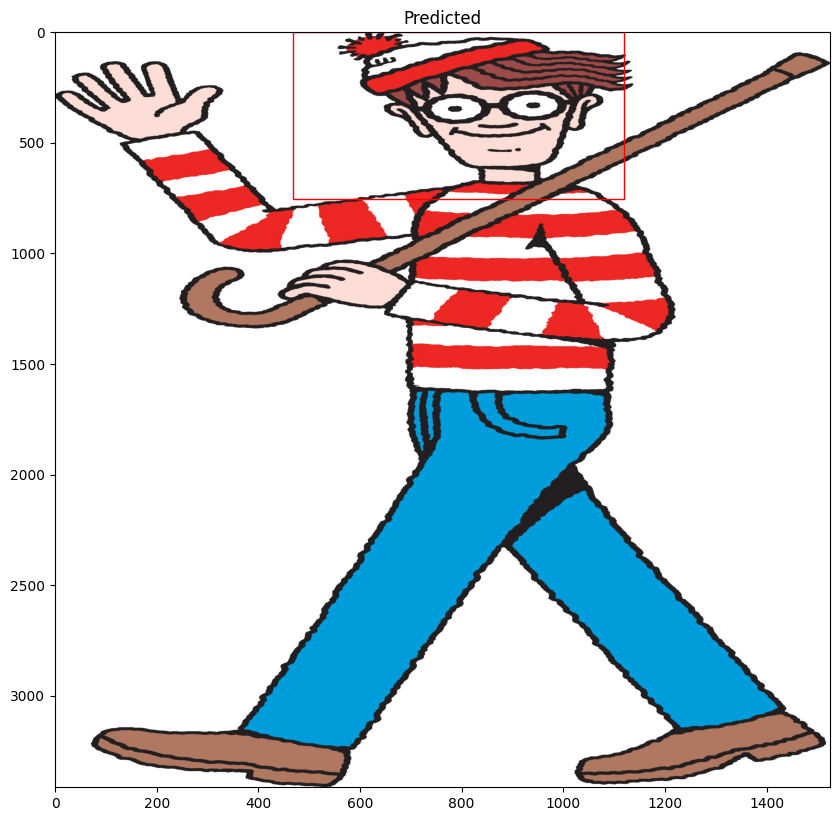

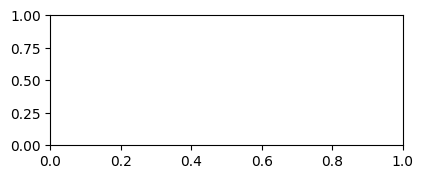

...

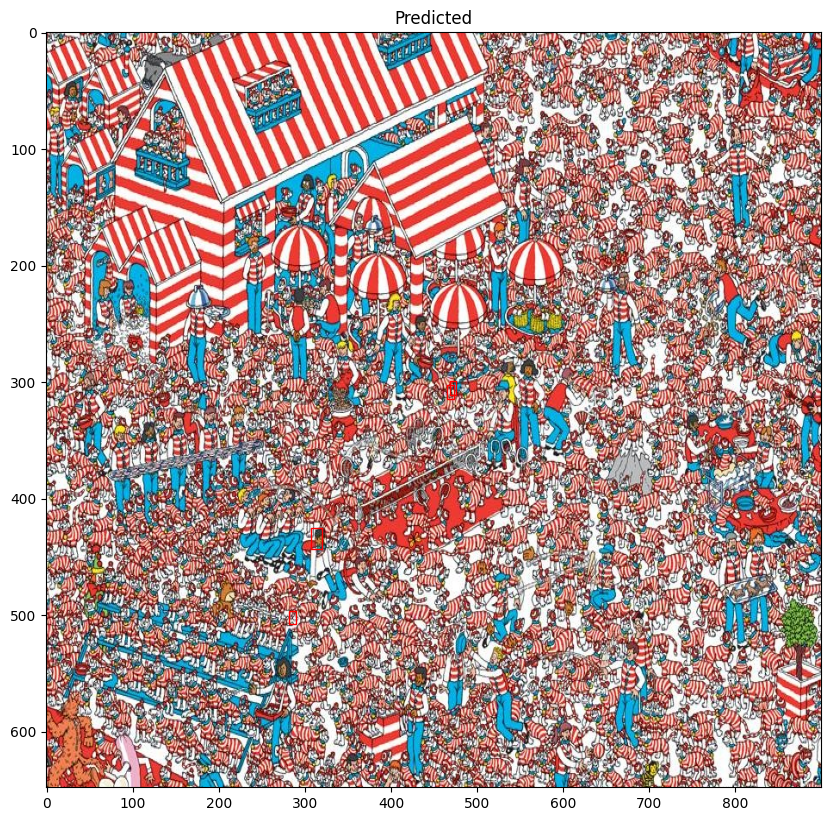

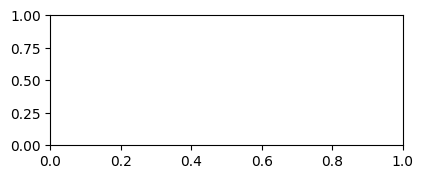

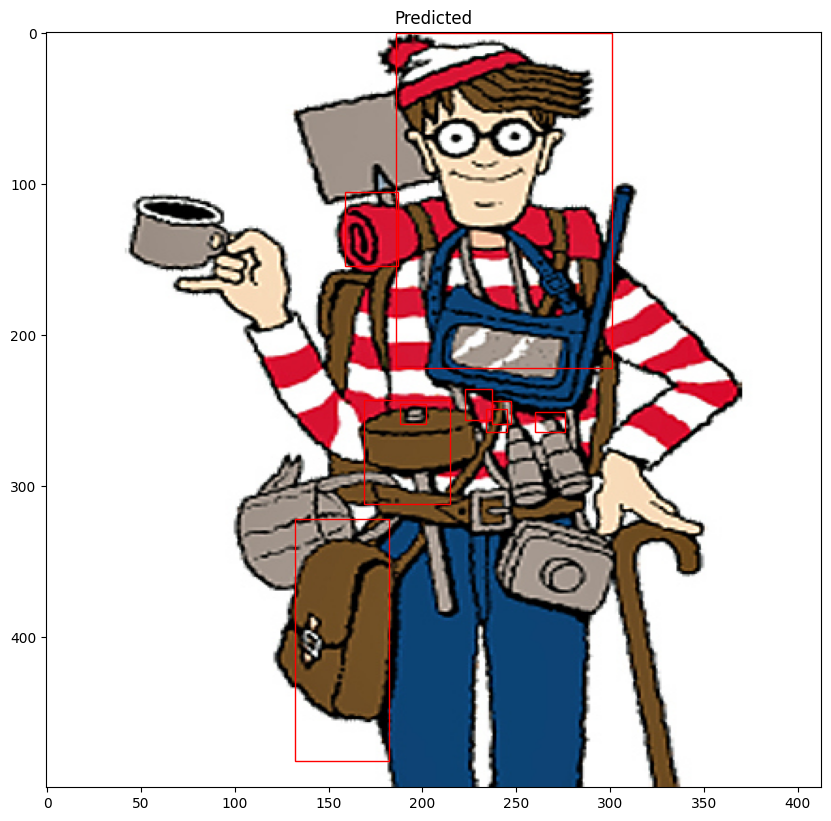

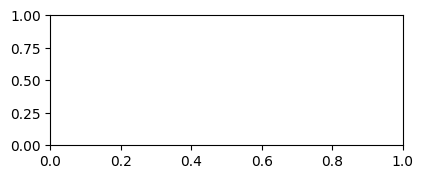

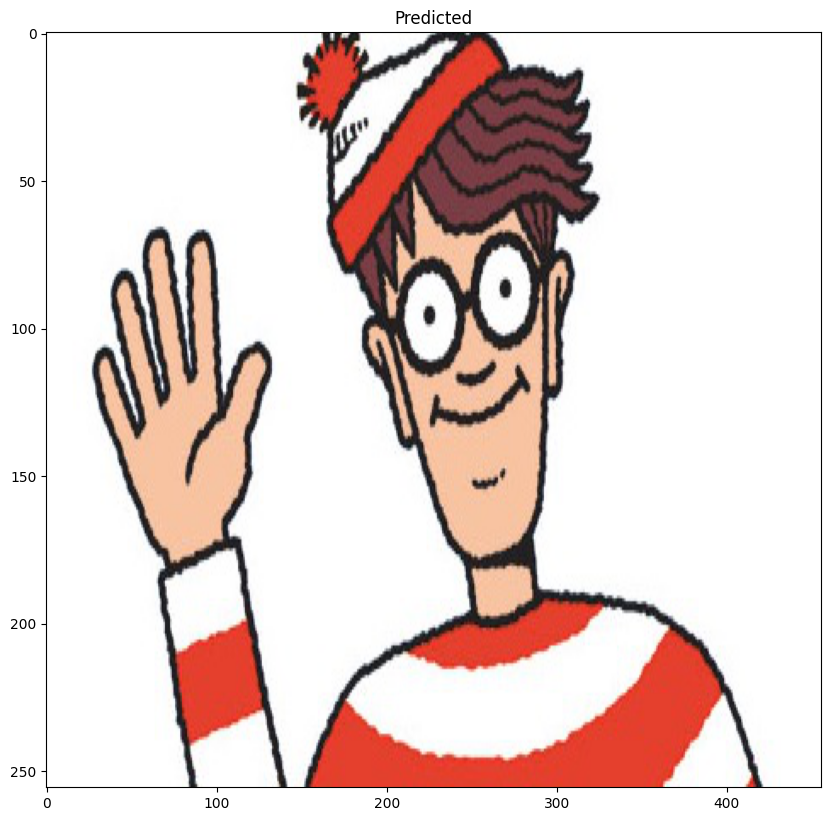

In [14]:
Test_cfg = TestConfig()

# define the model
model = MaskRCNN(mode='inference', model_dir='./', config=Test_cfg)
# load model weights
model_path = '/content/drive/My Drive/CSC 466/mask_rcnn_waldo_cfg_0005.h5'
model.load_weights(model_path, by_name=True)
# plot predictions for train dataset
plot_actual_vs_predicted(train_set, model, Test_cfg)
# plot predictions for test dataset
plot_actual_vs_predicted(test_set, model, Test_cfg)